<a href="https://colab.research.google.com/github/DwijBishnoi/Data-Driven-Drilling-Optimization/blob/main/Comparative%20Models/Comparative_Modelv1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Initial DataFrame Preview:
   Unnamed: 0 Input Parameters Unnamed: 2      Unnamed: 3  \
0         NaN              NaN        NaN             NaN   
1         NaN    Spindle Speed  Feed Rate  Drill Diameter   
2         NaN             4500        0.1               4   
3         NaN             4500        0.1               6   
4         NaN             4500        0.1               8   
5         NaN             4500        0.2               4   
6         NaN             4500        0.2               6   
7         NaN             4500        0.2               8   
8         NaN             4500        0.3               4   
9         NaN             4500        0.3               6   

     Output parameters    Unnamed: 5   Unnamed: 6    Unnamed: 7  
0         Minimization           NaN          NaN  Maximization  
1  Delamination Factor  Cylindricity  Circularity           MRR  
2                1.043         0.032        0.036       0.05325  
3             1.041772         0.037 

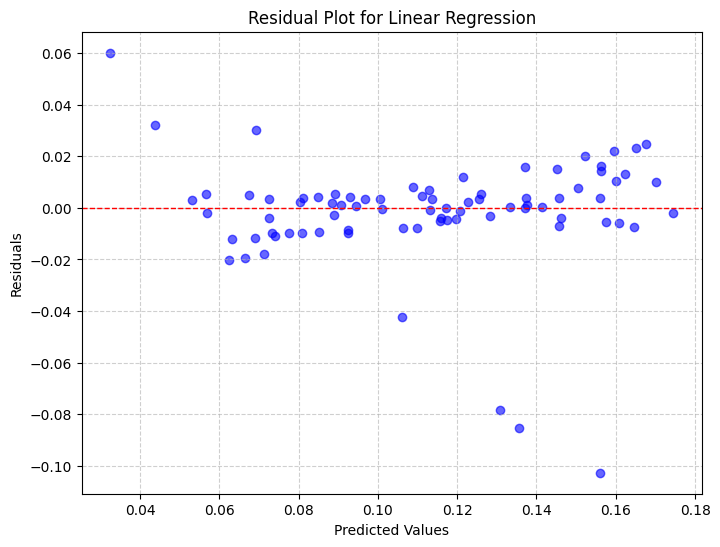

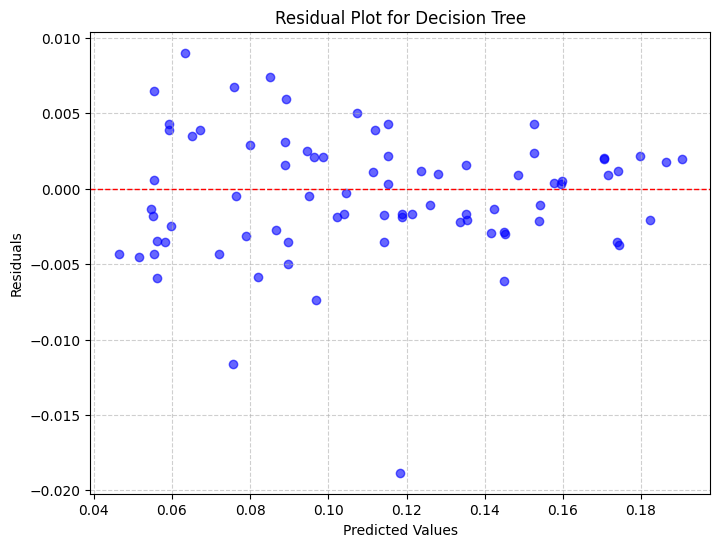

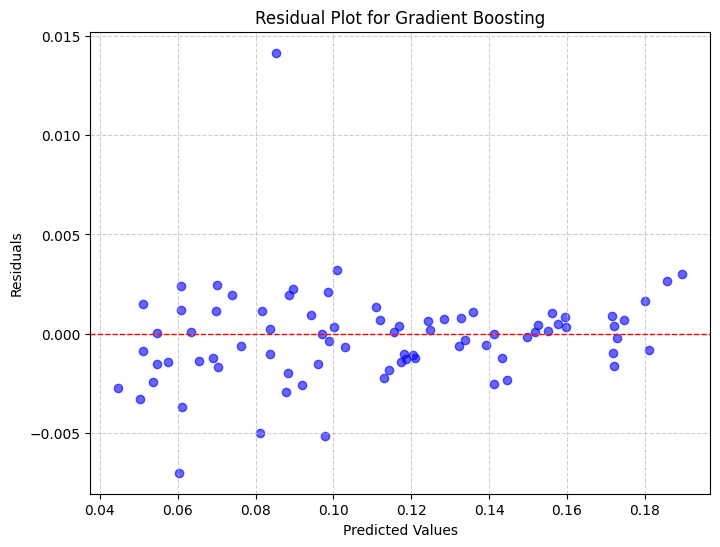

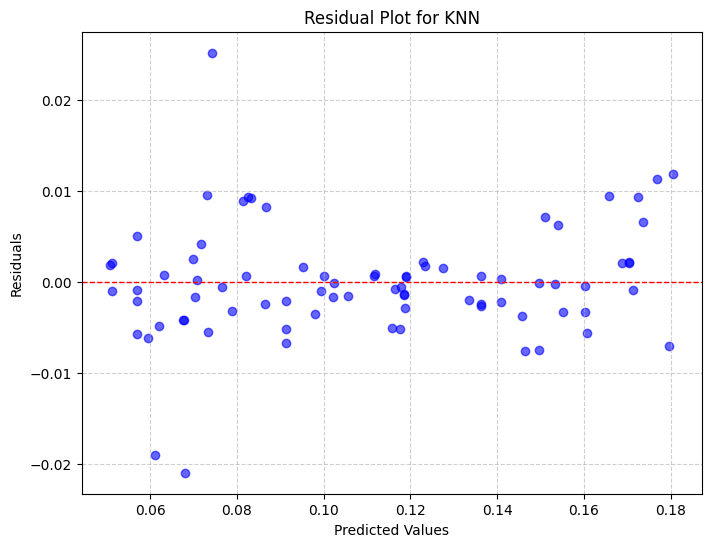

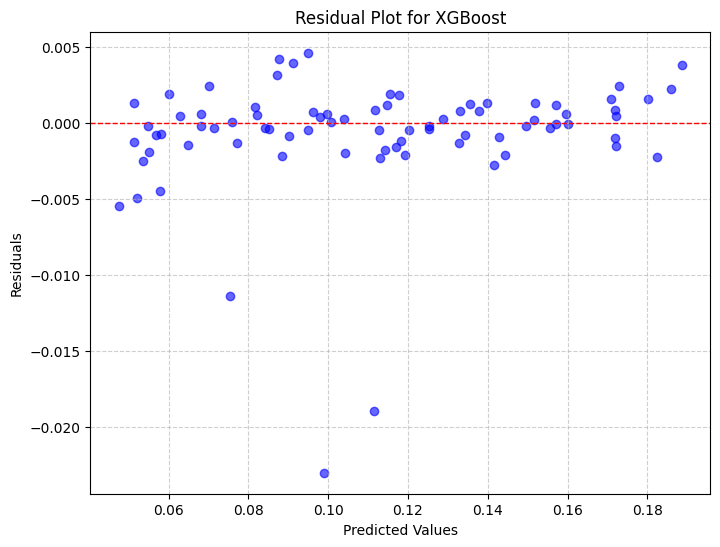

...

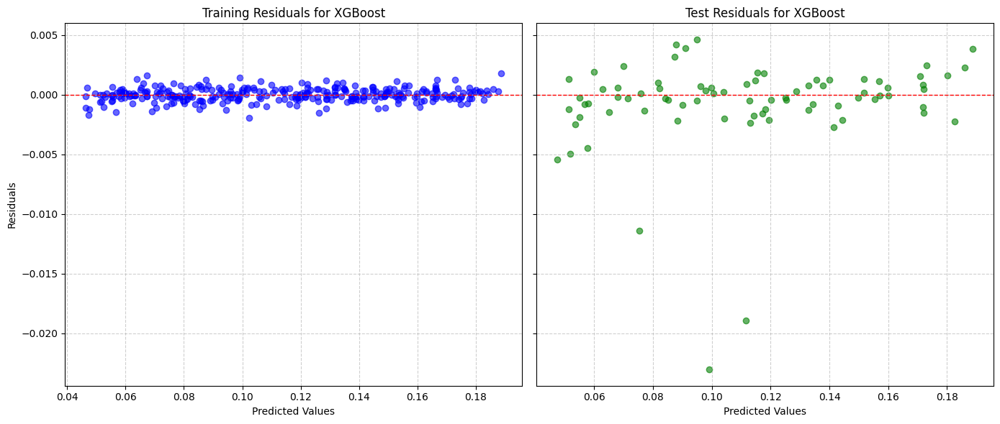

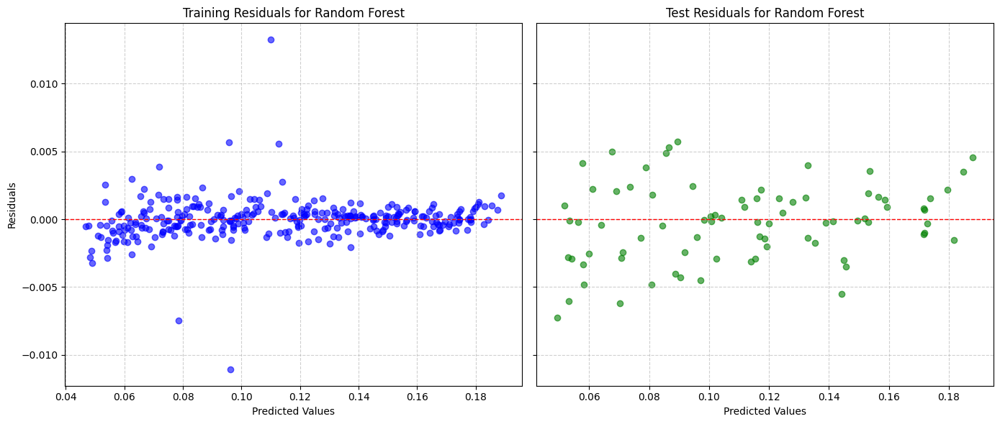

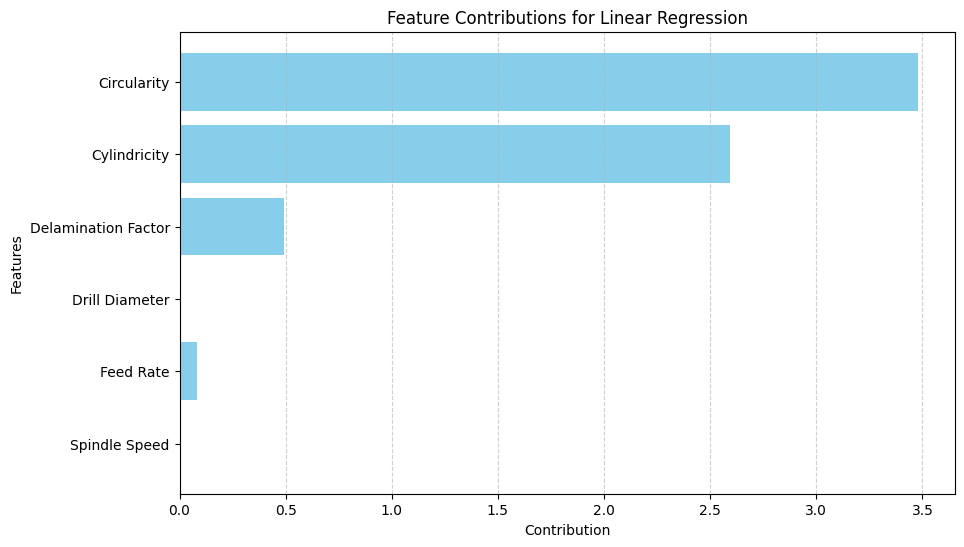

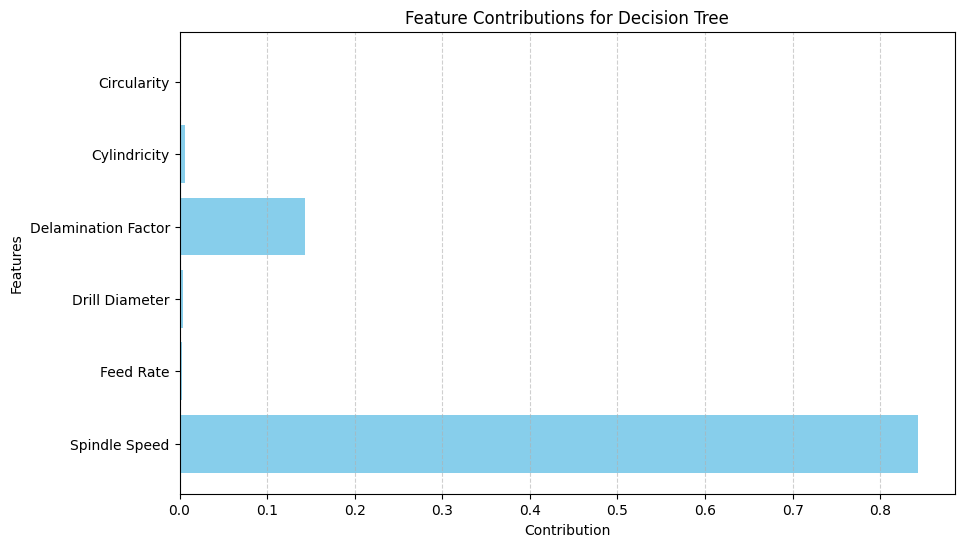

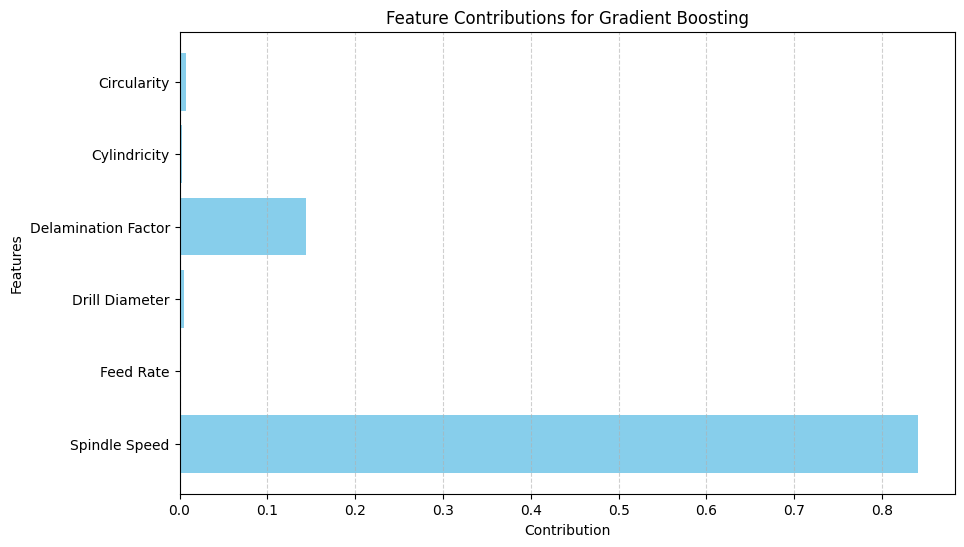

Model KNN does not provide feature contributions.


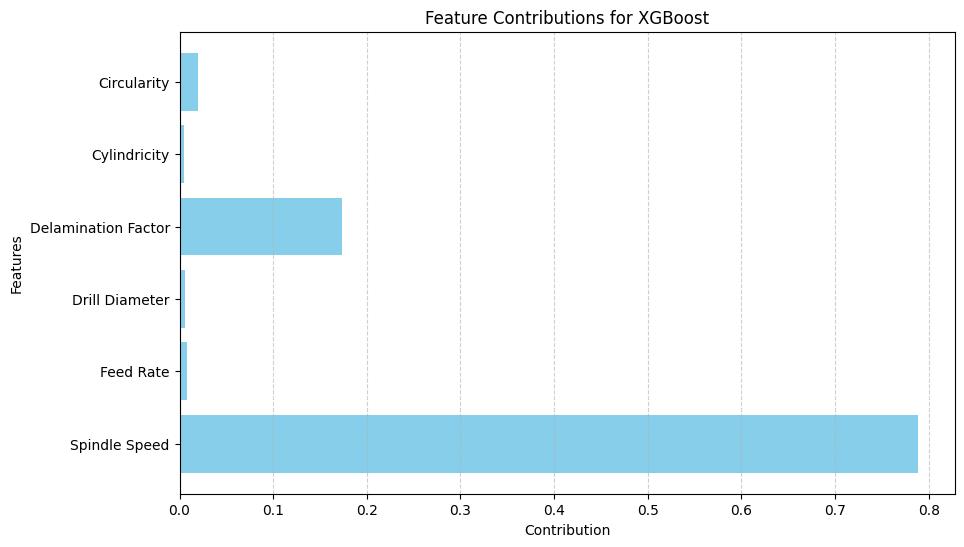

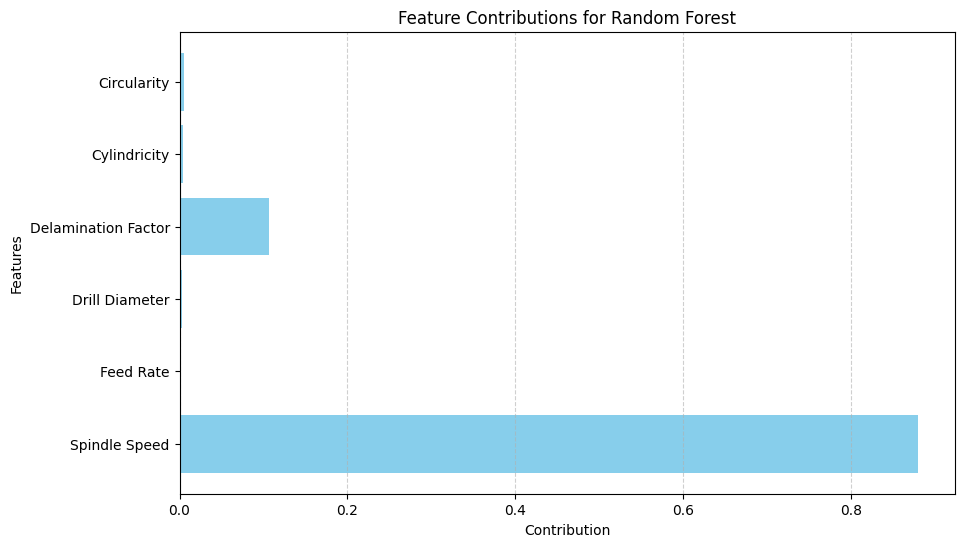

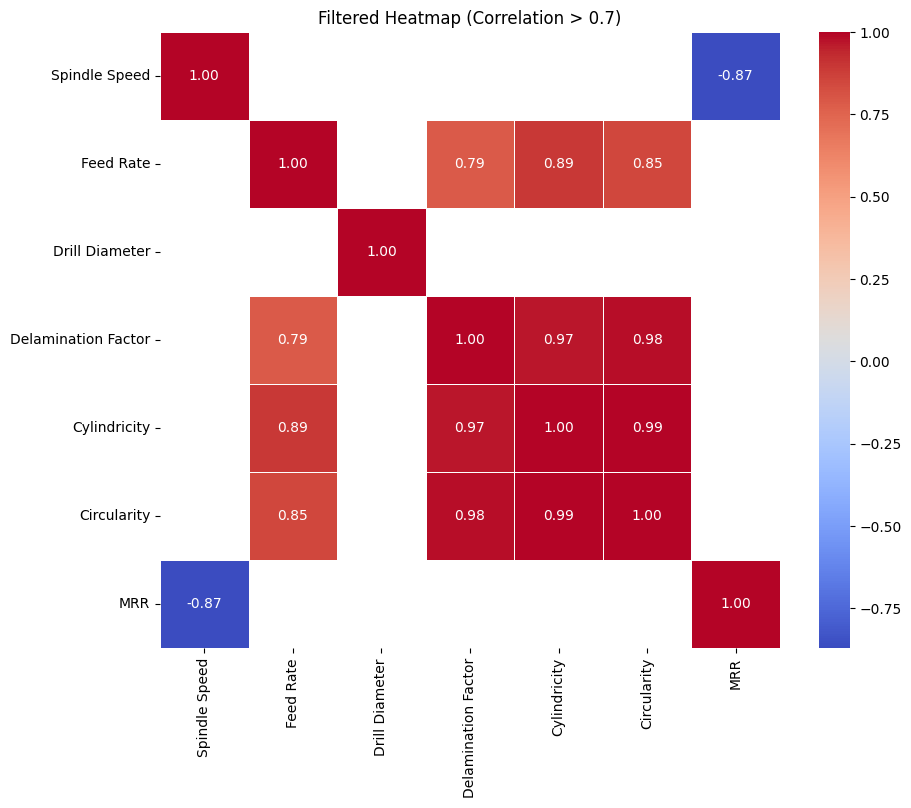

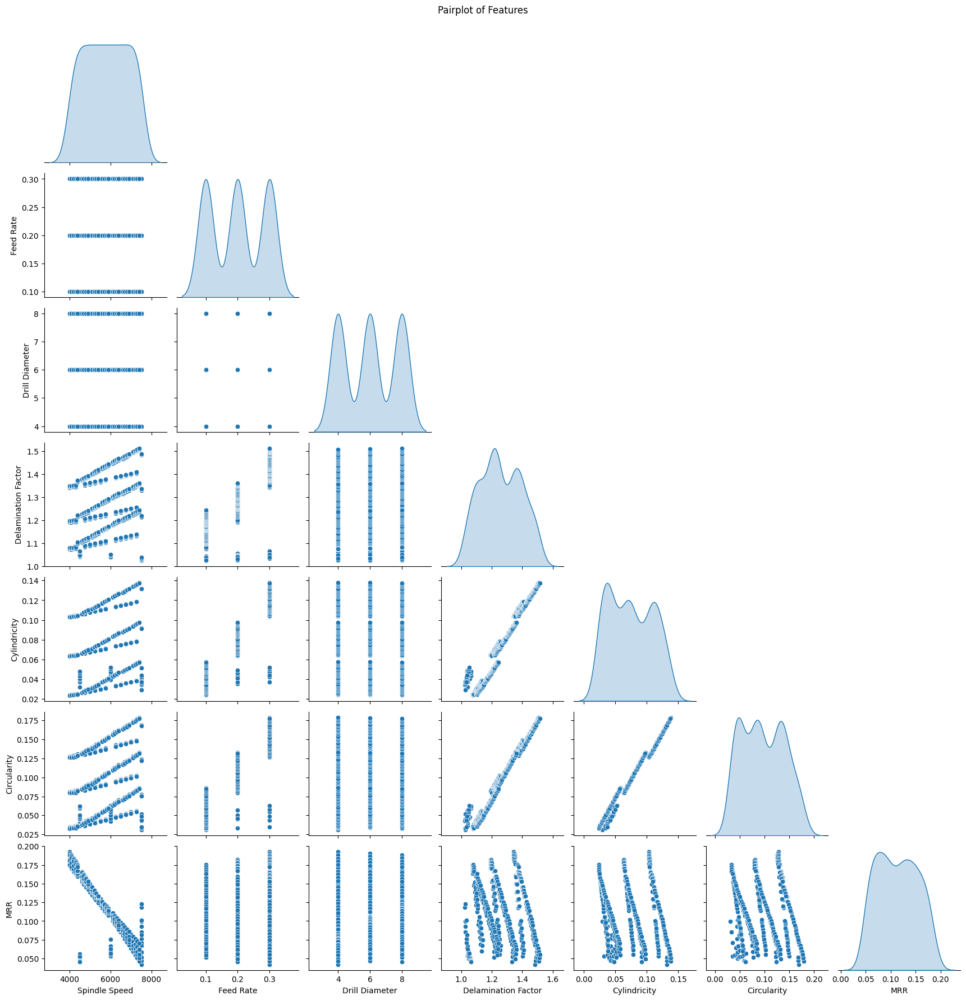


Model: Linear Regression
Generating SHAP explanations...
SHAP Summary Plot:


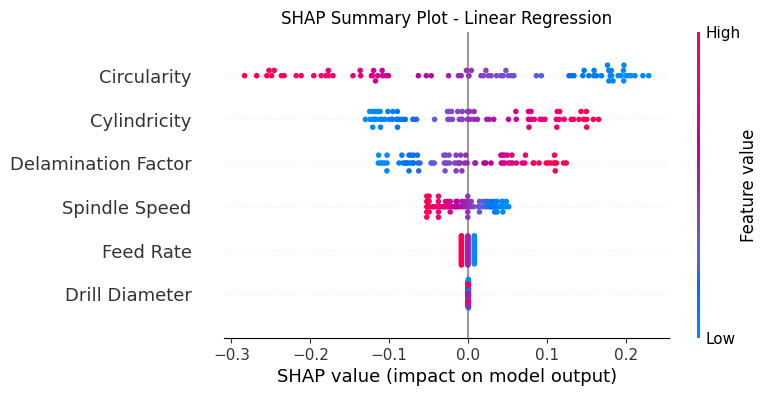

Generating LIME explanations...
LIME Explanation for Test Instance 0:


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


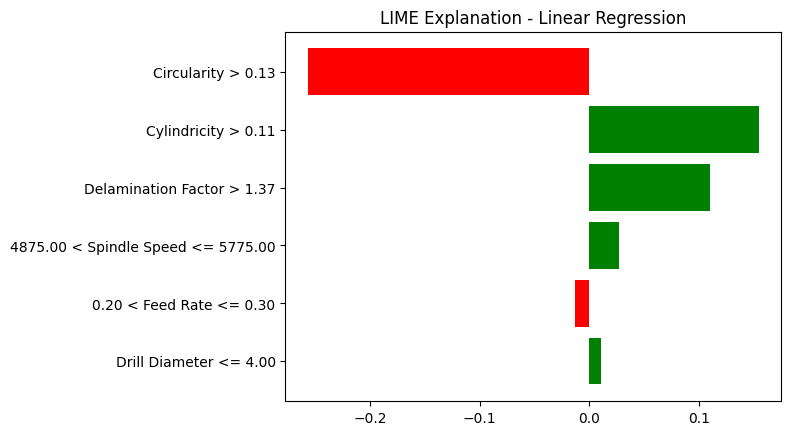


Model: Decision Tree
Generating SHAP explanations...
SHAP Summary Plot:


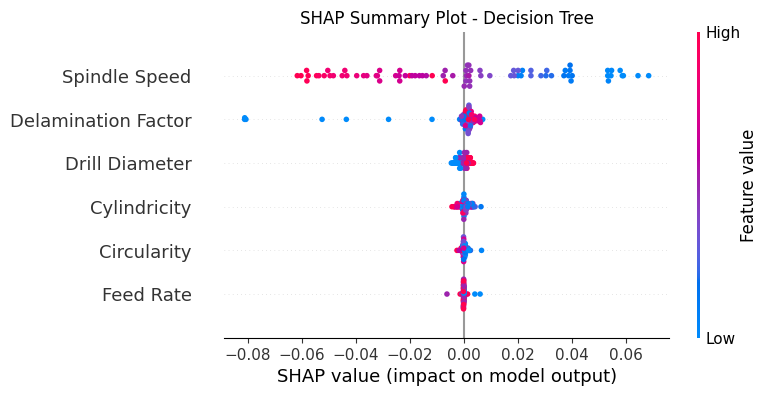

Generating LIME explanations...
LIME Explanation for Test Instance 0:


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


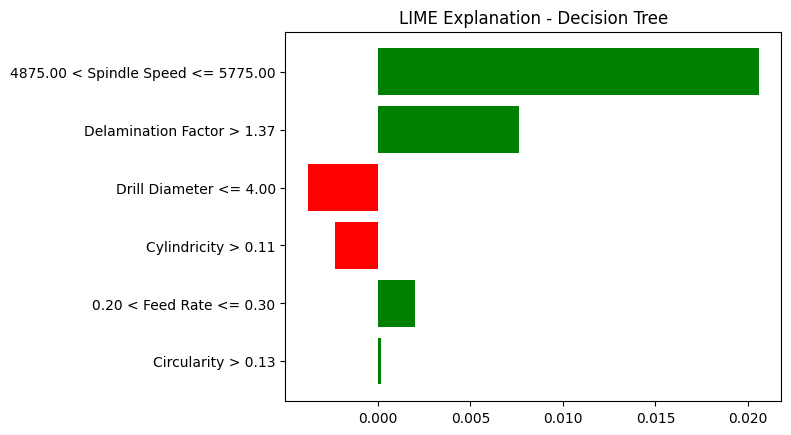


Model: Gradient Boosting
Generating SHAP explanations...
SHAP could not be applied to Gradient Boosting: An unknown model type was passed: <class 'sklearn.ensemble._gb.GradientBoostingRegressor'>
Generating LIME explanations...
LIME Explanation for Test Instance 0:


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


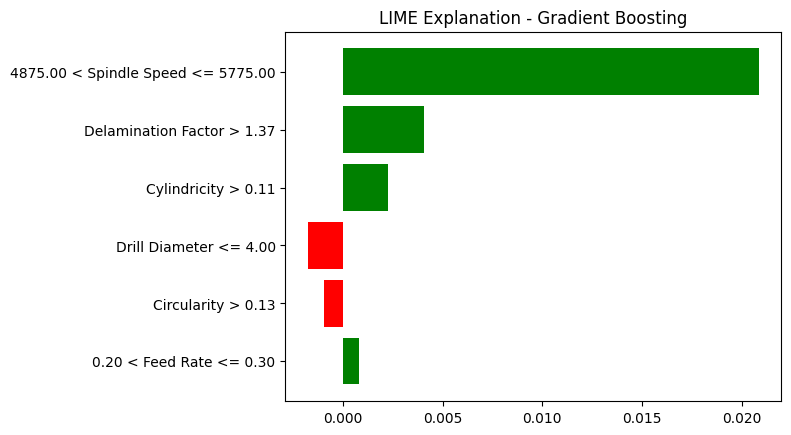


Model: KNN
Generating SHAP explanations...
SHAP could not be applied to KNN: An unknown model type was passed: <class 'sklearn.neighbors._regression.KNeighborsRegressor'>
Generating LIME explanations...
LIME Explanation for Test Instance 0:


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


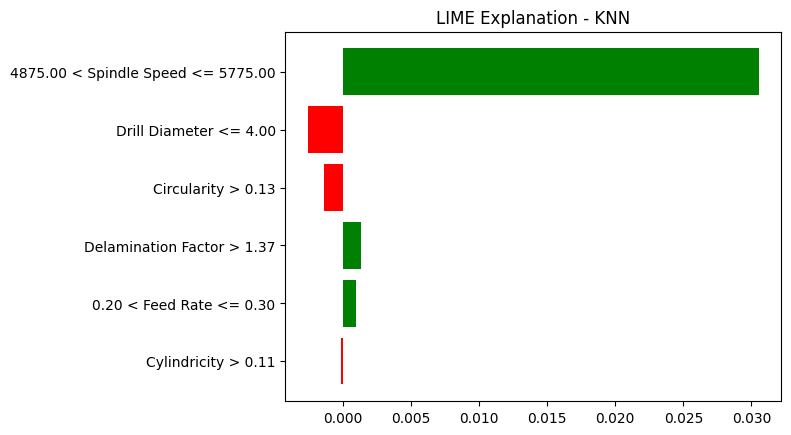


Model: XGBoost
Generating SHAP explanations...
SHAP could not be applied to XGBoost: An unknown model type was passed: <class 'xgboost.sklearn.XGBRegressor'>
Generating LIME explanations...
LIME Explanation for Test Instance 0:


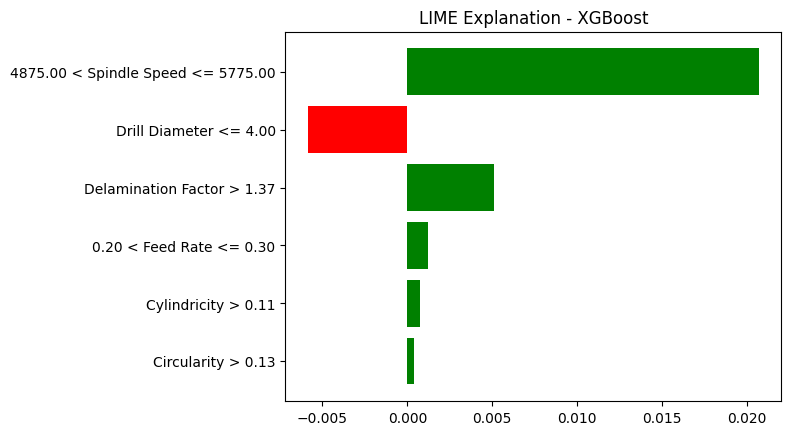


Model: Random Forest
Generating SHAP explanations...
SHAP could not be applied to Random Forest: An unknown model type was passed: <class 'sklearn.ensemble._forest.RandomForestRegressor'>
Generating LIME explanations...
LIME Explanation for Test Instance 0:


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


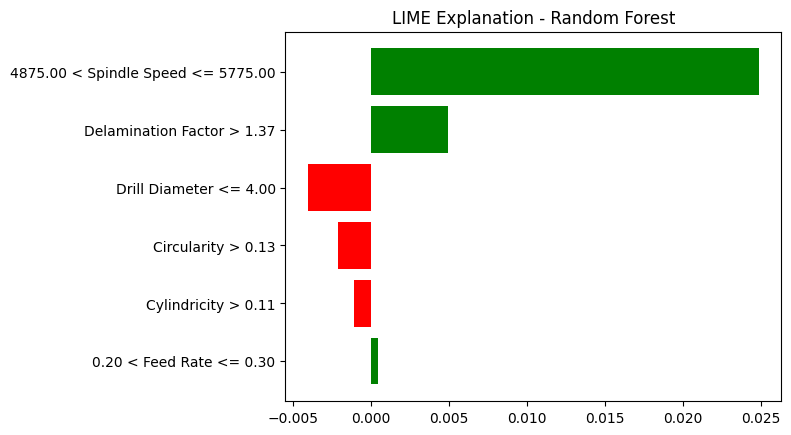

In [12]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import shap
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
file_path = '/content/sample_data/Dataset.xlsx'
df = pd.read_excel(file_path)

# Display the initial DataFrame preview
print("Initial DataFrame Preview:")
print(df.head(10))

# Check the columns in the DataFrame
print("Columns in the DataFrame:")
print(df.columns)

# Clean the DataFrame
# Remove the first row and set the second row as header
df.columns = df.iloc[1]  # Set the second row as header
df = df[2:]  # Remove the first two rows

# Reset index
df.reset_index(drop=True, inplace=True)

# Remove the first column if it contains only NaN values
df = df.loc[:, df.columns.notna()]

# Display cleaned columns
print("Cleaned DataFrame Columns:")
print(df.columns)

# Identify expected columns
expected_columns = ['Spindle Speed', 'Feed Rate', 'Drill Diameter',
                    'Delamination Factor', 'Cylindricity', 'Circularity', 'MRR']

# Rename columns only if they match
if len(df.columns) == len(expected_columns):
    df.columns = expected_columns
else:
    print(f"Warning: Expected {len(expected_columns)} columns, but got {len(df.columns)}. Current columns: {df.columns.tolist()}")

# Convert relevant columns to numeric, handling errors
df = df.apply(pd.to_numeric, errors='coerce')

# Handle NaN values if necessary (e.g., dropping)
df.dropna(inplace=True)

# Check the shape of the DataFrame after cleaning
print("Shape of DataFrame after cleaning:", df.shape)

# Ensure the DataFrame is not empty
if df.empty:
    raise ValueError("The DataFrame is empty after cleaning. Please check the data.")

# Split the data into features and target variable
X = df[['Spindle Speed', 'Feed Rate', 'Drill Diameter', 'Delamination Factor', 'Cylindricity', 'Circularity']]
y = df['MRR']

# Check if X and y are not empty
if X.empty or y.empty:
    raise ValueError("X or y is empty. Please check the data after splitting.")

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "KNN": KNeighborsRegressor(),
    "XGBoost": XGBRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42)
}

# Train models and evaluate metrics
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    results.append([
        name,
        mean_absolute_error(y_train, y_train_pred),
        mean_absolute_error(y_test, y_test_pred),
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred),
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)
    ])

metrics_df = pd.DataFrame(results, columns=[
    "Model", "Train MAE", "Test MAE", "Train MSE", "Test MSE",
    "Train RMSE", "Test RMSE", "Train R^2", "Test R^2"
])
print("Evaluation Metrics:")
print(metrics_df)

# Generate residual plots for each model
for name, model in models.items():
    # Predict on test data
    y_test_pred = model.predict(X_test)
    residuals = y_test - y_test_pred  # Calculate residuals

    # Create residual plot
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_pred, residuals, alpha=0.6, color='blue')
    plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
    plt.title(f'Residual Plot for {name}')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# Generate residual plots for each model (training and test data)
for name, model in models.items():
    # Predict on training and test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate residuals
    train_residuals = y_train - y_train_pred
    test_residuals = y_test - y_test_pred

    # Create subplots for training and test residuals
    fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    # Training residuals
    axs[0].scatter(y_train_pred, train_residuals, alpha=0.6, color='blue')
    axs[0].axhline(y=0, color='red', linestyle='--', linewidth=1)
    axs[0].set_title(f'Training Residuals for {name}')
    axs[0].set_xlabel('Predicted Values')
    axs[0].set_ylabel('Residuals')
    axs[0].grid(True, linestyle='--', alpha=0.6)

    # Test residuals
    axs[1].scatter(y_test_pred, test_residuals, alpha=0.6, color='green')
    axs[1].axhline(y=0, color='red', linestyle='--', linewidth=1)
    axs[1].set_title(f'Test Residuals for {name}')
    axs[1].set_xlabel('Predicted Values')
    axs[1].grid(True, linestyle='--', alpha=0.6)

    # Show the plots
    plt.tight_layout()
    plt.show()

# Feature names
feature_names = X.columns

# Contribution plot for models with feature importance or coefficients
for name, model in models.items():
    try:
        # Get feature importance or coefficients
        if hasattr(model, 'feature_importances_'):
            contributions = model.feature_importances_
        elif hasattr(model, 'coef_'):
            contributions = np.abs(model.coef_)  # Take absolute value for positive contributions
        else:
            print(f"Model {name} does not provide feature contributions.")
            continue

        # Plot contributions
        plt.figure(figsize=(10, 6))
        plt.barh(feature_names, contributions, color='skyblue')
        plt.title(f'Feature Contributions for {name}')
        plt.xlabel('Contribution')
        plt.ylabel('Features')
        plt.grid(axis='x', linestyle='--', alpha=0.6)
        plt.show()

    except Exception as e:
        print(f"Could not generate contribution plot for {name}: {e}")

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Heatmap
plt.figure(figsize=(10, 8))
mask = (correlation_matrix.abs() < 0.7)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, mask=mask)
plt.title('Filtered Heatmap (Correlation > 0.7)')
plt.show()

# Pairplot for detailed correlation visualization
sns.pairplot(df, diag_kind='kde', corner=True)
plt.suptitle('Pairplot of Features', y=1.02)
plt.show()

# Loop through each model and generate SHAP and LIME explanations
for name, model in models.items():
    print(f"\nModel: {name}")

    # SHAP Implementation
    try:
        print("Generating SHAP explanations...")

        # Choose the correct SHAP explainer based on the model
        if hasattr(model, "predict_proba") or "tree" in name.lower():
            explainer = shap.TreeExplainer(model)
        else:
            explainer = shap.LinearExplainer(model, X_train)

        # Compute SHAP values for test data
        shap_values = explainer.shap_values(X_test)

        # SHAP Summary Plot (Global Explanation)
        print("SHAP Summary Plot:")
        shap.summary_plot(shap_values, X_test, show=False)
        plt.title(f"SHAP Summary Plot - {name}")
        plt.show()

    except Exception as e:
        print(f"SHAP could not be applied to {name}: {e}")

    # LIME Implementation
    try:
        print("Generating LIME explanations...")

        # Create LIME explainer
        lime_explainer = LimeTabularExplainer(
            training_data=X_train.values,
            feature_names=X_train.columns,
            class_names=['MRR'],
            mode='regression'
        )

        # Choose a specific test instance to explain (e.g., first instance)
        i = 0  # Index of the test instance
        lime_exp = lime_explainer.explain_instance(
            data_row=X_test.iloc[i].values,
            predict_fn=model.predict
        )

        # LIME Explanation Visualization
        print(f"LIME Explanation for Test Instance {i}:")
        lime_exp.show_in_notebook()
        lime_exp.as_pyplot_figure()
        plt.title(f"LIME Explanation - {name}")
        plt.show()

    except Exception as e:
        print(f"LIME could not be applied to {name}: {e}")
